In [11]:
%matplotlib inline
import matplotlib.pyplot as plt 
import numpy as np 
import cv2
from skimage import img_as_float
from skimage.morphology import watershed

from skimage.filters import threshold_otsu
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from skimage.morphology import closing, square
from skimage.color import label2rgb

plt.style.use('dark_background')

# Morphological Operations

In [12]:
#ThresholdingandMorphing for 2 lines:
def morph(BW1,struct1):
    cl_morph1 = cv2.morphologyEx(BW1, cv2.MORPH_OPEN, struct1)
    op_morph1 = cv2.morphologyEx(cl_morph1, cv2.MORPH_OPEN, struct1)
    return op_morph1

def open_morph(BW1,struct1):
    op_morph1 = cv2.morphologyEx(BW1, cv2.MORPH_OPEN, struct1)
    return op_morph1

def close_morph(BW1,struct1):
    cl_morph1 = cv2.morphologyEx(BW1, cv2.MORPH_OPEN, struct1)
    return cl_morph1

def grad_morph(BW1,struct1):
    grad_morph1 = cv2.morphologyEx(BW1, cv2.MORPH_GRADIENT, struct1)
    return grad_morph1

def dil_morph(BW1,struct1,iterations):
    dil_morph1 = cv2.dilate(BW1,struct1,iterations = 1)
    return dil_morph1

def err_morph(BW1,struct1,iterations):
    err_morph1 = cv2.erode(BW1,struct1,iterations = 1)
    return err_morph1

# Original Image

In [13]:
Blob = cv2.cvtColor(cv2.imread('crop_blobs.jpg'), cv2.COLOR_BGR2RGB)  
Blob_sub = cv2.cvtColor(cv2.imread('blobs_sub.jpg'), cv2.COLOR_BGR2RGB)  
Blob_sub1 = cv2.cvtColor(cv2.imread('blobs_sub1.png'), cv2.COLOR_BGR2RGB)  


# Thresholding

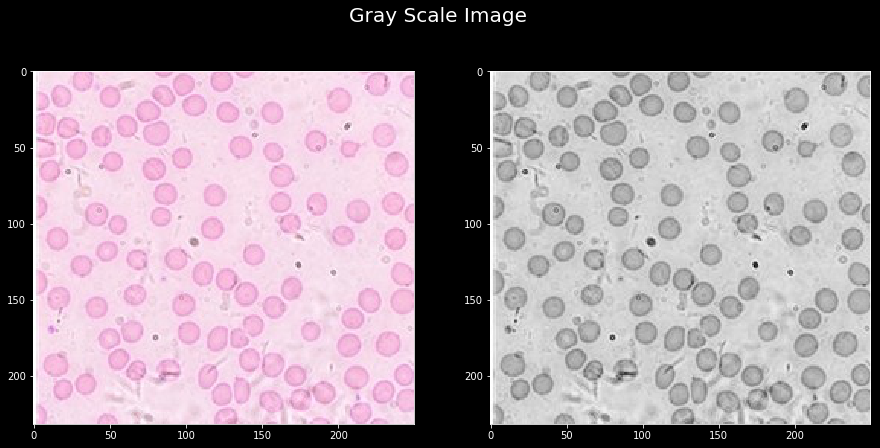

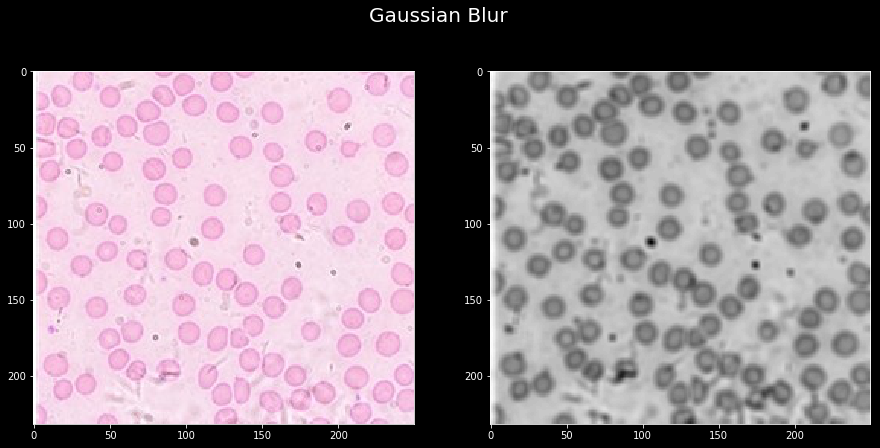

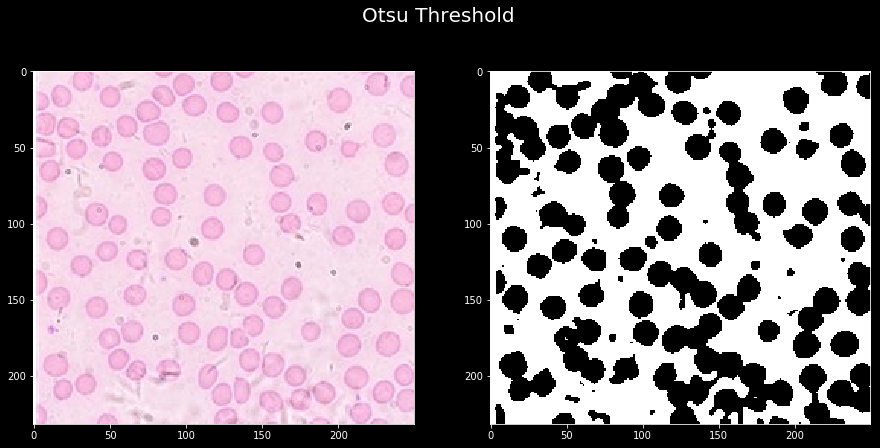

In [14]:
# Grayscale
g_Blob = cv2.cvtColor(Blob, cv2.COLOR_RGB2GRAY)
# Gaussian Blur
Gauss_Blob = cv2.GaussianBlur(g_Blob,(5,5),cv2.BORDER_DEFAULT)
# Otsu's Method
ret3,Otsu_Blob = cv2.threshold(Gauss_Blob,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('Gray Scale Image')
plt.subplot(121)
plt.imshow(Blob,'gray')
plt.subplot(122)
plt.imshow(g_Blob,'gray')
plt.show()
plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('Gaussian Blur')
plt.subplot(121)
plt.imshow(Blob,'gray')
plt.subplot(122)
plt.imshow(Gauss_Blob,'gray')
plt.show()
plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('Otsu Threshold')
plt.subplot(121)
plt.imshow(Blob,'gray')
plt.subplot(122)
plt.imshow(Otsu_Blob,'gray')
plt.show()

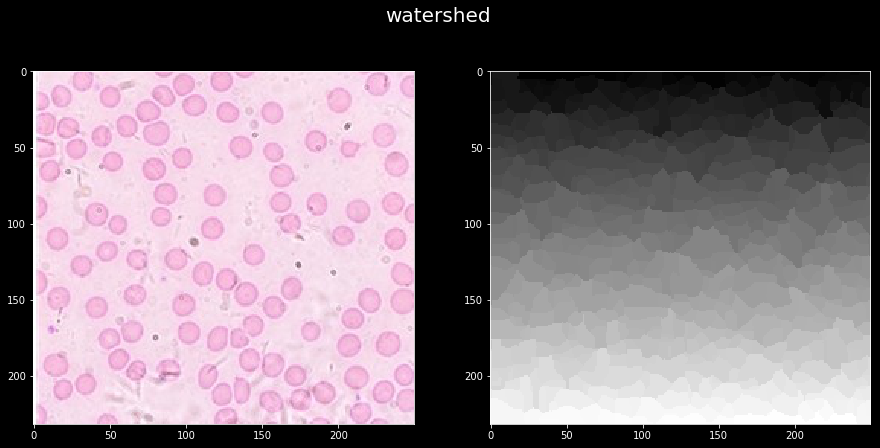

In [15]:
# Watershed trial
W = watershed(Gauss_Blob)



plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('watershed')
plt.subplot(121)
plt.imshow(Blob,'gray')
plt.subplot(122)
plt.imshow(W,'gray')
plt.show()

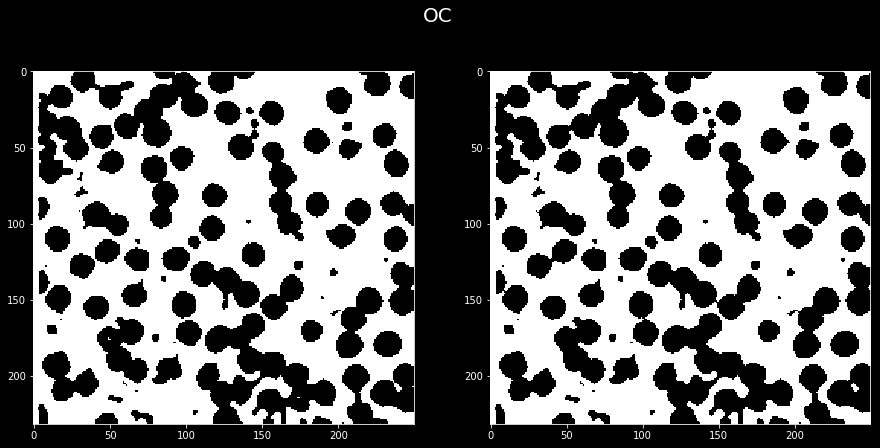

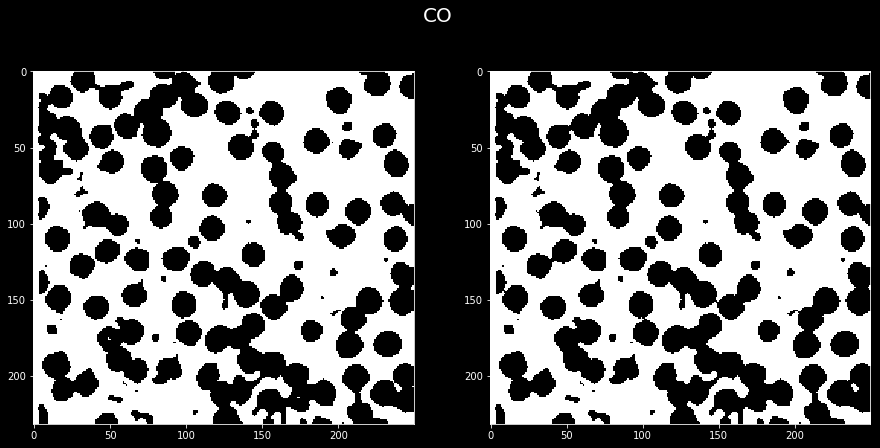

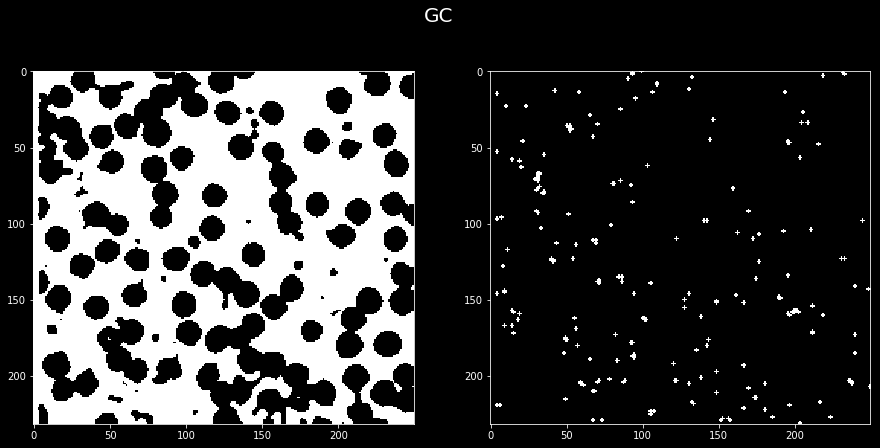

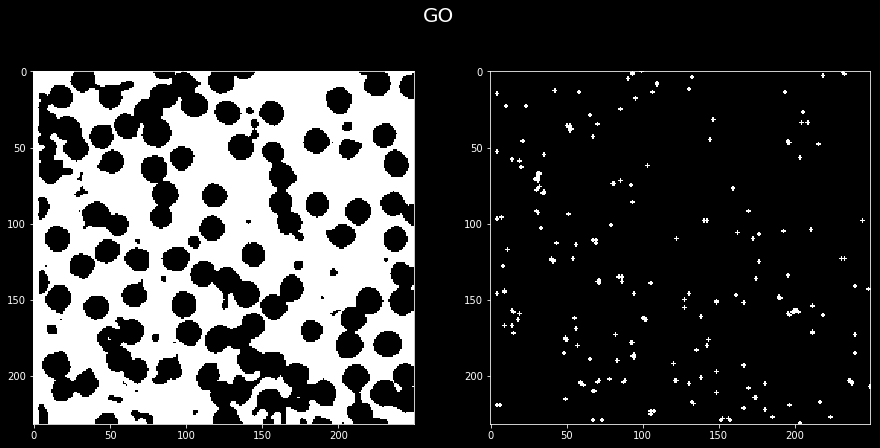

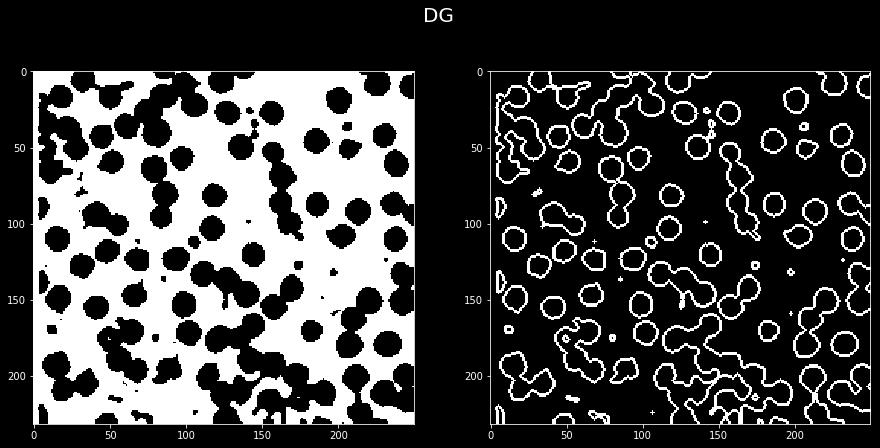

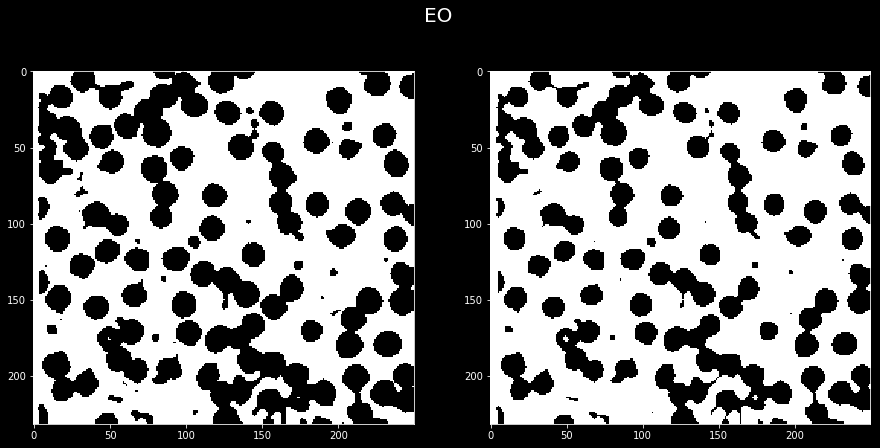

In [16]:
# CLEANING
# Structure Elements
struct1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))
# Morph Ops 
O_cmorph = close_morph(Otsu_Blob,struct1)
O_omorph = open_morph(Otsu_Blob,struct1)
O_gradmorph = grad_morph(Otsu_Blob,struct1)
O_dilmorph = dil_morph(Otsu_Blob,struct1,1)
O_errmorph = err_morph(Otsu_Blob,struct1,1)

# Opening to Closing
OC = close_morph(O_omorph,struct1)
# Closing to Opening
CO = open_morph(O_cmorph,struct1)
# Gradient to Closing
GC = close_morph(O_gradmorph,struct1)
# Gradient to Opening
GO = open_morph(O_gradmorph,struct1)
# Dilation to Gradient
DG = grad_morph(O_dilmorph,struct1)
# Erode to Open
EO = open_morph(O_dilmorph,struct1)


plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('OC')
plt.subplot(121)
plt.imshow(Otsu_Blob,'gray')
plt.subplot(122)
plt.imshow(OC,'gray')
plt.show()
plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('CO')
plt.subplot(121)
plt.imshow(Otsu_Blob,'gray')
plt.subplot(122)
plt.imshow(CO,'gray')
plt.show()
plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('GC')
plt.subplot(121)
plt.imshow(Otsu_Blob,'gray')
plt.subplot(122)
plt.imshow(GC,'gray')
plt.show()
plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('GO')
plt.subplot(121)
plt.imshow(Otsu_Blob,'gray')
plt.subplot(122)
plt.imshow(GO,'gray')
plt.show()
plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('DG')
plt.subplot(121)
plt.imshow(Otsu_Blob,'gray')
plt.subplot(122)
plt.imshow(DG,'gray')
plt.show()
plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] = 17
plt.rcParams["figure.titlesize"] = 20
plt.suptitle('EO')
plt.subplot(121)
plt.imshow(Otsu_Blob,'gray')
plt.subplot(122)
plt.imshow(EO,'gray')
plt.show()

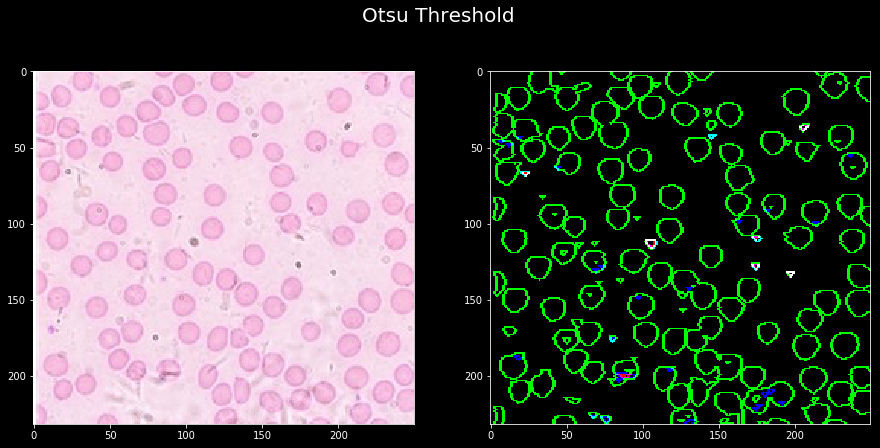

In [17]:
# Binarization
thresh, BW = cv2.threshold(Blob, 200, 255, cv2.THRESH_BINARY_INV)
# Structure element
struct1 = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,2))
# Opening to gradient
Op1 = open_morph(BW,struct1)
OG = grad_morph(Op1,struct1)

plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] == 17
plt.rcParams["figure.titlesize"] == 20
plt.suptitle('Otsu Threshold'),
plt.subplot(121)
plt.imshow(Blob,'gray')
plt.subplot(122)
plt.imshow(OG)
plt.show()

In [18]:
# Read image
im = OG
 
# Set up the detector with default parameters.
detector = cv2.SimpleBlobDetector_create()
 
# Detect blobs.
keypoints = detector.detect(im)
print(len(keypoints))
# Draw detected blobs as red circles.
# cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS ensures the size of the circle corresponds to the size of blob
im_with_keypoints = cv2.drawKeypoints(im, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
 
# Show keypoints
cv2.imwrite("Keypoints.jpg", im_with_keypoints)



65


True

In [1]:
# Setup SimpleBlobDetector parameters.
params = cv2.SimpleBlobDetector_Params()
 
# Change thresholds
params.minThreshold = 0;
params.maxThreshold = 255;
 
# Filter by Area.
params.filterByArea = True
params.minArea = 3
 
# Filter by Circularity
params.filterByCircularity = True
params.minCircularity = 0.1
 
# Filter by Convexity
params.filterByConvexity = True
params.minConvexity = 0.9
 
# Filter by Inertia
params.filterByInertia = True
params.minInertiaRatio = 0.05

detector = cv2.SimpleBlobDetector_create(params)

# Detect blobs.
im = OG
keypoints = detector.detect(im)
print(len(keypoints))
# Draw detected blobs as red circles.
# cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS ensures the size of the circle corresponds to the size of blob
im_with_keypoints = cv2.drawKeypoints(im, keypoints, np.array([]), (0,0,255), cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
 
# Show keypoints
cv2.imwrite("Keypoints.jpg", im_with_keypoints)

NameError: name 'cv2' is not defined

In [96]:
dia = []
for keypoint in keypoints:
    x = keypoint.pt[0]
    y = keypoint.pt[1]
    s = keypoint.size
    print(x,y)
    ar = (np.pi)*((s/2)**2)
#    print(ar)
    dia.append(ar)
print('Area of the Image: ',OG.shape[0]*OG.shape[1])
print('Best Estimate of Area: ', np.mean(dia),' +/- ',np.std(dia))

153.0 229.5
72.28685760498047 227.06759643554688
174.21751403808594 214.48207092285156
123.51982879638672 212.9239044189453
229.6134033203125 211.49586486816406
19.05108642578125 209.60536193847656
84.96939086914062 203.21273803710938
82.25333404541016 204.44000244140625
34.1966552734375 205.36972045898438
211.70204162597656 201.93142700195312
171.9250030517578 200.47291564941406
113.91008758544922 201.30072021484375
67.1868667602539 197.2815704345703
14.844114303588867 193.50625610351562
55.724212646484375 189.7318115234375
49.808109283447266 176.37933349609375
206.80780029296875 180.73287963867188
80.21556854248047 175.45155334472656
232.39178466796875 179.94815063476562
120.48949432373047 176.74154663085938
12.441849708557129 170.4542999267578
181.82859802246094 171.28680419921875
101.90730285644531 172.34950256347656
63.719444274902344 170.96852111816406
209.5153350830078 163.1451873779297
157.63392639160156 155.60714721679688
41.309635162353516 155.92742919921875
98.4958724975586 

/home/nbuser/anaconda3_420/lib/python3.5/site-packages/matplotlib/pyplot.py:528: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


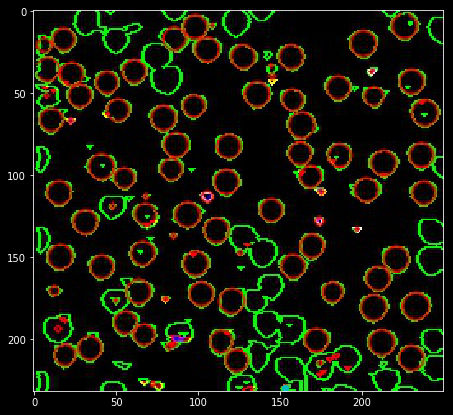

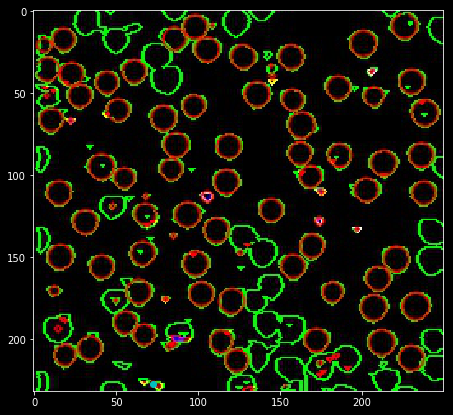

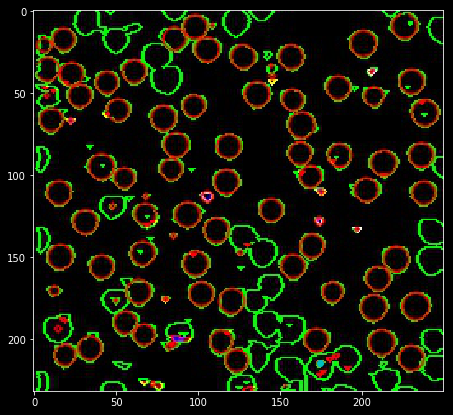

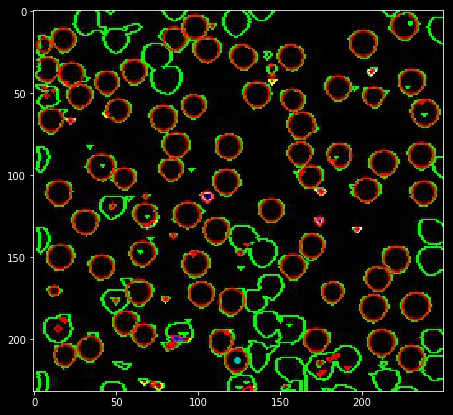

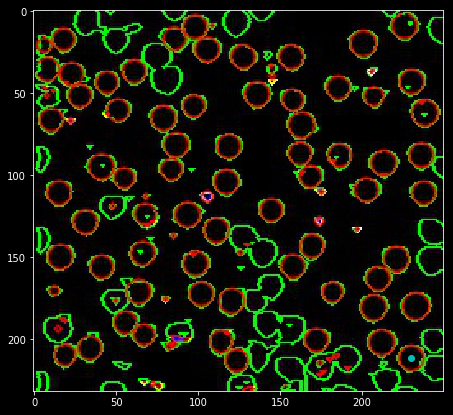

...

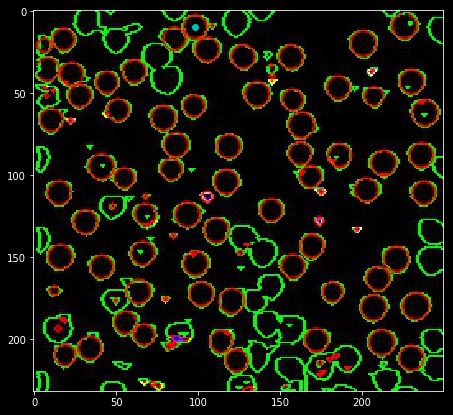

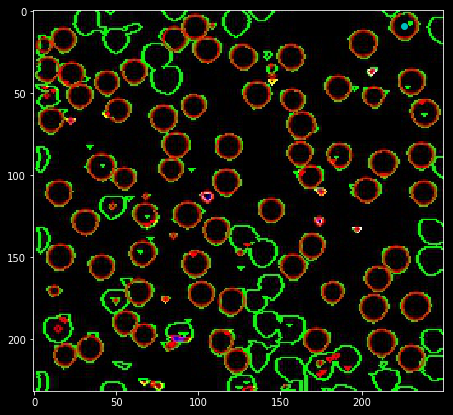

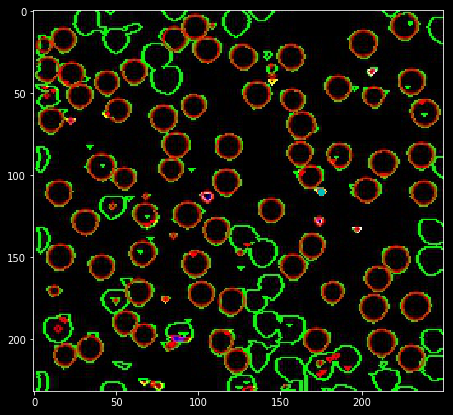

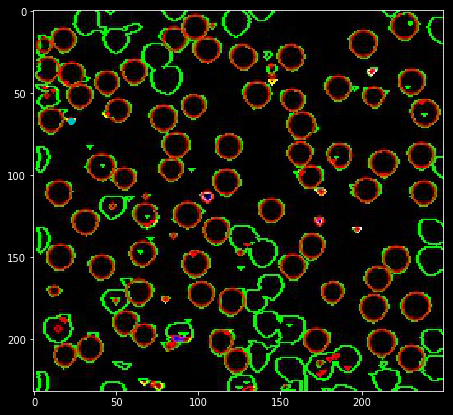

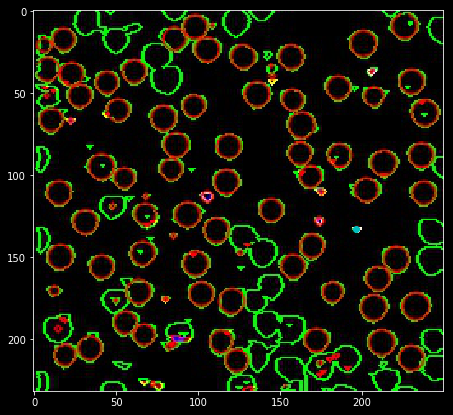

In [33]:
 for keypoint in keypoints:
    x = keypoint.pt[0]
    y = keypoint.pt[1]
    s = keypoint.size
    keypp = cv2.cvtColor(cv2.imread('Keypointsrr.jpg'), cv2.COLOR_BGR2RGB)
    
plt.figure(figsize=[15,7])
plt.rcParams['axes.titlesize'] == 17
plt.rcParams["figure.titlesize"] == 20
plt.imshow(keypp,'gray')
plt.
